In [6]:
import Pkg
Pkg.activate("../.")

  Activating project at `~/Documents/MPSTime.jl`


In [29]:
using MPSTime
using Plots
using JLD2
using Random
using DelimitedFiles
using Optimization
using KernelDensity
using Plots.PlotMeasures
using StatsBase
using ColorSchemes

# ECG

Load in the ECG data

In [15]:
ecg_base_dir = "/Users/jmoo2880/Documents/MPSTime.jl/Folds/ECG200/"
ecg_train = readdlm(ecg_base_dir*"ECG200_TRAIN.txt");
X_train_ecg = ecg_train[:, 2:end];
y_train_ecg = ecg_train[:, 1]
@assert size(X_train_ecg, 2) == 96 "Expected length 96 time series."
@assert size(X_train_ecg, 1) == 100 "Expected 100 training instances"

In [4]:
# chi_max = 80
# d = 18
# eta = 0.05
# nsweeps = 10
# mps_opts = MPSOptions(; d = d, chi_max=chi_max, nsweeps=nsweeps, eta=eta, sigmoid_transform=false, verbosity=1, log_level=-1);

In [ ]:
# mps, _, _ = fitMPS(X_train_ecg, mps_opts)

Generating initial weight MPS with bond dimension χ_init = 4
        using random state 1234.
Initialising train states.
blas_name = "LBTConfig([ILP64] libopenblas64_.dylib)"
Using 1 iterations per update.
Using optimiser CustomGD with the "TSGO" algorithm
Starting backward sweeep: [1/10]


┌ Warning: Not using MKL BLAS, which may lead to worse performance.
│ To fix this, Import MPSTime into Julia first or use the MKL package
└ @ MPSTime /Users/jmoo2880/Documents/MPSTime.jl/src/Training/RealRealHighDimension.jl:829


Backward sweep finished.
Starting forward sweep: [1/10]
Finished sweep 1. Time for sweep: 19.51s
Using optimiser CustomGD with the "TSGO" algorithm
Starting backward sweeep: [2/10]
Backward sweep finished.
Starting forward sweep: [2/10]
Finished sweep 2. Time for sweep: 105.9s
Using optimiser CustomGD with the "TSGO" algorithm
Starting backward sweeep: [3/10]
Backward sweep finished.
Starting forward sweep: [3/10]
Finished sweep 3. Time for sweep: 106.25s
Using optimiser CustomGD with the "TSGO" algorithm
Starting backward sweeep: [4/10]
Backward sweep finished.
Starting forward sweep: [4/10]
Finished sweep 4. Time for sweep: 102.38s
Using optimiser CustomGD with the "TSGO" algorithm
Starting backward sweeep: [5/10]
Backward sweep finished.
Starting forward sweep: [5/10]
Finished sweep 5. Time for sweep: 102.99s
Using optimiser CustomGD with the "TSGO" algorithm
Starting backward sweeep: [6/10]
Backward sweep finished.
Starting forward sweep: [6/10]
Finished sweep 6. Time for sweep: 10

3-element Vector{Any}:
 TrainedMPS(ITensors.ITensorMPS.MPS
[1] ((dim=18|id=658|"Site,n=1"), (dim=15|id=972|"Link,l=1"))
[2] ((dim=18|id=89|"Site,n=2"), (dim=15|id=972|"Link,l=1"), (dim=80|id=26|"Link,l=2"))
[3] ((dim=18|id=323|"Site,n=3"), (dim=80|id=26|"Link,l=2"), (dim=80|id=99|"Link,l=3"))
[4] ((dim=18|id=410|"Site,n=4"), (dim=80|id=99|"Link,l=3"), (dim=80|id=689|"Link,l=4"))
[5] ((dim=18|id=80|"Site,n=5"), (dim=80|id=689|"Link,l=4"), (dim=80|id=750|"Link,l=5"))
[6] ((dim=18|id=177|"Site,n=6"), (dim=80|id=750|"Link,l=5"), (dim=80|id=87|"Link,l=6"))
[7] ((dim=18|id=854|"Site,n=7"), (dim=80|id=87|"Link,l=6"), (dim=80|id=181|"Link,l=7"))
[8] ((dim=18|id=190|"Site,n=8"), (dim=80|id=181|"Link,l=7"), (dim=80|id=463|"Link,l=8"))
[9] ((dim=18|id=145|"Site,n=9"), (dim=80|id=463|"Link,l=8"), (dim=80|id=706|"Link,l=9"))
[10] ((dim=18|id=248|"Site,n=10"), (dim=80|id=706|"Link,l=9"), (dim=80|id=643|"Link,l=10"))
[11] ((dim=18|id=978|"Site,n=11"), (dim=80|id=643|"Link,l=10"), (dim=80|id=724|"Link

In [ ]:
# imp_ecg = init_imputation_problem(mps, X_train_ecg)

Initialising train states.
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
                         Summary:

 - Dataset has 100 training samples and 100 testing samples.
Slicing MPS into individual states...
 - 1 class(es) were detected.
 - Time independent encoding - Legendre - detected.
 - d = 18, chi_max = 80
Re-encoding the training data to get the encoding arguments...

 Created 1 ImputationProblem struct(s) containing class-wise mps and test samples.


ImputationProblem(ITensors.ITensorMPS.MPS[ITensors.ITensorMPS.MPS
[1] ((dim=18|id=658|"Site,n=1"), (dim=15|id=972|"Link,l=1"))
[2] ((dim=18|id=89|"Site,n=2"), (dim=15|id=972|"Link,l=1"), (dim=80|id=26|"Link,l=2"))
[3] ((dim=18|id=323|"Site,n=3"), (dim=80|id=26|"Link,l=2"), (dim=80|id=99|"Link,l=3"))
[4] ((dim=18|id=410|"Site,n=4"), (dim=80|id=99|"Link,l=3"), (dim=80|id=689|"Link,l=4"))
[5] ((dim=18|id=80|"Site,n=5"), (dim=80|id=689|"Link,l=4"), (dim=80|id=750|"Link,l=5"))
[6] ((dim=18|id=177|"Site,n=6"), (dim=80|id=750|"Link,l=5"), (dim=80|id=87|"Link,l=6"))
[7] ((dim=18|id=854|"Site,n=7"), (dim=80|id=87|"Link,l=6"), (dim=80|id=181|"Link,l=7"))
[8] ((dim=18|id=190|"Site,n=8"), (dim=80|id=181|"Link,l=7"), (dim=80|id=463|"Link,l=8"))
[9] ((dim=18|id=145|"Site,n=9"), (dim=80|id=463|"Link,l=8"), (dim=80|id=706|"Link,l=9"))
[10] ((dim=18|id=248|"Site,n=10"), (dim=80|id=706|"Link,l=9"), (dim=80|id=643|"Link,l=10"))
[11] ((dim=18|id=978|"Site,n=11"), (dim=80|id=643|"Link,l=10"), (dim=80|id=72

"IMPUTE" all sites with no pre-conditioning.

In [16]:
# imputed_ts_ecg, pred_err_ecg, target_ts_ecg, stats_ecg, plots_ecg = MPS_impute(imp_ecg, 0, 1, collect(1:96), :ITS; rseed=42, num_trajectories=100, rejection_threshold=2.0)

In [17]:
@load "ecg_synthgen_saved.jld2"

5-element Vector{Symbol}:
 :imputed_ts_ecg
 :pred_err_ecg
 :target_ts_ecg
 :stats_ecg
 :plots_ecg

In [18]:
mean_synthetic = mean(imputed_ts_ecg)
std_synthetic = std(imputed_ts_ecg)
mean_real = mean(X_train_ecg; dims=1)[1, :]
std_real = std(X_train_ecg; dims=1)[1, :]

96-element Vector{Float64}:
 0.5935128982505872
 0.9279719819328901
 1.0468800211894889
 1.098753662034098
 0.9547343215125306
 0.9631108612044943
 1.0967122827421285
 0.8776404248424444
 0.7617531971905132
 0.7391851359895361
 ⋮
 0.4340019749182154
 0.4543948842482049
 0.5898787384177827
 0.7721036765405389
 0.8710452248428904
 0.8323122916607146
 0.6655482967807774
 0.619798649957833
 0.41364376515603196

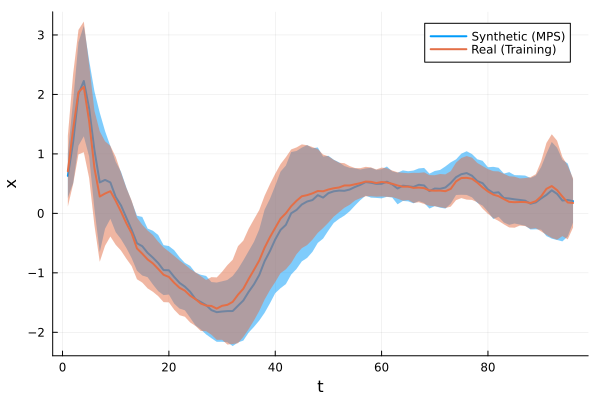

In [19]:
plot(mean_synthetic, xlabel="t", ylabel="x", label="Synthetic (MPS)", ribbon=std_synthetic,ribbon_alpha=0.3, lw=2)
plot!(mean_real, label="Real (Training)", ribbon=std_real, ribbon_alpha=0.3, lw=2)

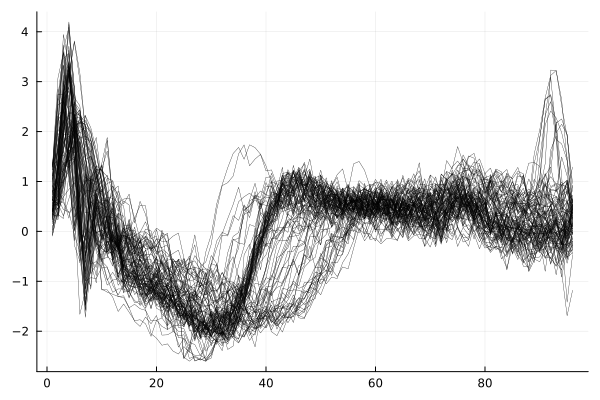

In [20]:
plot(imputed_ts_ecg, label="", c="black", lw=0.3)
#plot!(X_train_ecg', label="", c="red", lw=0.3)

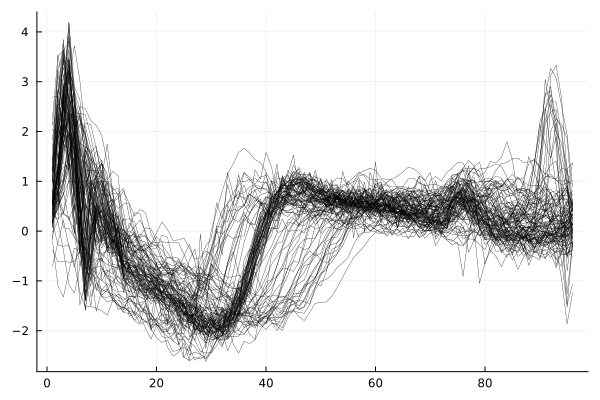

In [21]:
plot(X_train_ecg', label="", c="black", lw=0.3)

In [24]:
maximum([0.3, 0.4, 0.5])

0.5

In [30]:
function truncated_colormap(cmap::ColorScheme, start::Float64, stop::Float64, n::Int=256)
    ra = range(start, stop; length=n)
    colors = [get(cmap, r) for r in ra]
    return cgrad(colors)
end
my_cmap = truncated_colormap(ColorSchemes.magma, 0.0, 0.6)

In [31]:
function make_kde_heatmap(trajectories::AbstractMatrix{<:Real}, which_pts_imputed::Union{Vector, UnitRange}, 
    overplot_samples::Union{Nothing, Int}=nothing; max_x=nothing, min_x=nothing, include_cbar::Bool=true)

    kde_vals = []
    x_vals = []
    n_tpts = size(trajectories, 2)
    fixed_pts = setdiff(1:n_tpts, which_pts_imputed) # conditioning points
    if isnothing(max_x)
        @show max_x = maximum(maximum(trajectories, dims=2))
    end
    if isnothing(min_x)
        @show min_x = minimum(minimum(trajectories, dims=2))
    end
    # time-marginalized density
    for t in 1:size(trajectories, 2)
        kde_v = kde(trajectories[:, t]; boundary=(min_x, max_x), npoints=1000)
        normalised_density = kde_v.density./maximum(kde_v.density)
        push!(kde_vals, normalised_density)
        push!(x_vals, kde_v.x)
    end
    kde_matrix = hcat(kde_vals...)';
    if length(fixed_pts) != 0
        kde_matrix[fixed_pts, :] = zeros(length(fixed_pts), size(kde_matrix, 2))
    end
    xval_matrix = hcat(x_vals...)';
    fstyle = font("arial", 23)
    p = heatmap(collect(1:size(trajectories, 2)), xval_matrix[1, :], kde_matrix', c=my_cmap, 
        alpha=0.96, xlabel="t", ylabel="x", xlims=(1, size(trajectories, 2)), ylims=(min_x, max_x),
        xtickfont=fstyle,
        ytickfont=fstyle,
        guidefont=fstyle,
        titlefont=fstyle,
        size=(1200, 600),
        left_margin=10mm,
        right_margin=10mm,
        bottom_margin=10mm,
        colorbar=:none)
    if length(fixed_pts) > 0
        vline!([which_pts_imputed[1]-1], lw=2, ls=:dot, c=:white, label="")
    end

    if !isnothing(overplot_samples)
        # sample random trajectories and overplot them
        pidxs = sample(1:size(trajectories, 1), overplot_samples; replace=false)
        for pid in pidxs
            plot!(collect(which_pts_imputed), trajectories[pid, which_pts_imputed], c=:white, lw=2, 
                alpha=0.05, label="")
        end
    end

    return p 

end

make_kde_heatmap (generic function with 2 methods)

In [32]:
ecg_train_dist = make_kde_heatmap(X_train_ecg, collect(1:96), 100, max_x=4.5, min_x=-3.0)
ecg_synth_dist = make_kde_heatmap(hcat(imputed_ts_ecg...)', collect(1:96), 100, max_x=4.5, min_x=-3.0);

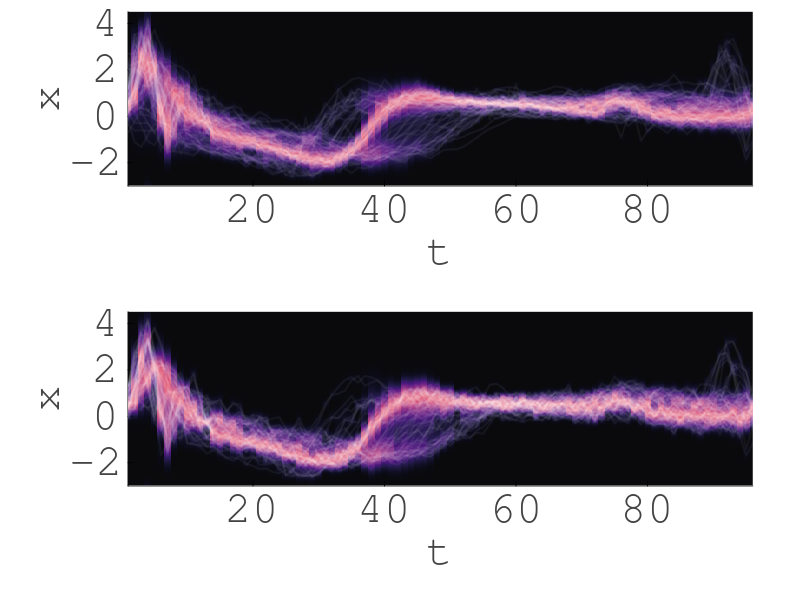

In [ ]:
plot(ecg_train_dist, ecg_synth_dist, layout=(2, 1), size=(800, 600))
#savefig("ecg_synthgen_paper.pdf") 

# IPD

Load the IPD data

In [37]:
ipd_base_dir = "/Users/jmoo2880/Documents/MPSTime.jl/Folds/IPD/"
ipd_train = readdlm(ipd_base_dir*"ItalyPowerDemand_TRAIN.txt");
X_train_ipd = ipd_train[:, 2:end];
y_train_ipd = ipd_train[:, 1]
@assert size(X_train_ipd, 2) == 24 "Expected length 96 time series."
@assert size(X_train_ipd, 1) == 67 "Expected 100 training instances"

Use the same opts as for ECG

In [38]:
# mps_ipd, _, _ = fitMPS(X_train_ipd, mps_opts)

In [39]:
# imp_ipd = init_imputation_problem(mps_ipd, X_train_ipd)

In [ ]:
# imputed_ts_ipd, pred_err_ipd, target_ts_ipd, stats_ipd, plots_ipd = MPS_impute(imp_ipd, 0, 1, collect(1:24), :ITS; rseed=42, num_trajectories=67, rejection_threshold=2.0)

([[-0.3900288394749998, -0.9292023540250001, -1.47566199715, -1.6158647742749999, -1.710805237525, -1.47477883005, -1.023259650175, -0.940021151, -0.367508078425, 0.9609960317499997  …  0.5494401631500003, 0.95658019625, 0.9395792295749996, 0.5637916285250002, 0.18447135907499979, 0.021306237350000146, -0.2485013116999999, 1.3628370622500001, 0.7505814701750002, -0.05310059082499996], [-0.8287420964000001, -1.0389358662000001, -1.4440887733249999, -1.638827118875, -1.7728477263, -1.4513749019000002, -0.8631856133000002, -0.45074657760000014, 0.07319230447500003, 0.4452264453499999  …  0.18513373439999992, 0.06259429927500015, 0.3123097967999997, 0.9872702529750002, 1.4825062043, 1.3328093808499997, 1.22329666045, 0.5973519783249999, 0.22244754437500003, -0.3860545875250001], [-0.24099439135000011, -0.8446391042000001, -1.418918510975, -1.4255422642250002, -1.4990659253, -1.4301788915, -1.17803468445, -0.6538750106, -0.2935428337999999, 0.18491294262500002  …  -0.48033267545000013, -0.3

In [40]:
@load "/Users/jmoo2880/Documents/MPSTime.jl/Paper_Analysis/ipd_synthgen_saved.jld2"

5-element Vector{Symbol}:
 :imputed_ts_ipd
 :pred_err_ipd
 :target_ts_ipd
 :stats_ipd
 :plots_ipd

In [41]:
ipd_train_dist = make_kde_heatmap(X_train_ipd, collect(1:24), 67, max_x=2.5, min_x=-2.0)
ipd_synth_dist = make_kde_heatmap(hcat(imputed_ts_ipd...)', collect(1:24), 67, max_x=2.5, min_x=-2.0);

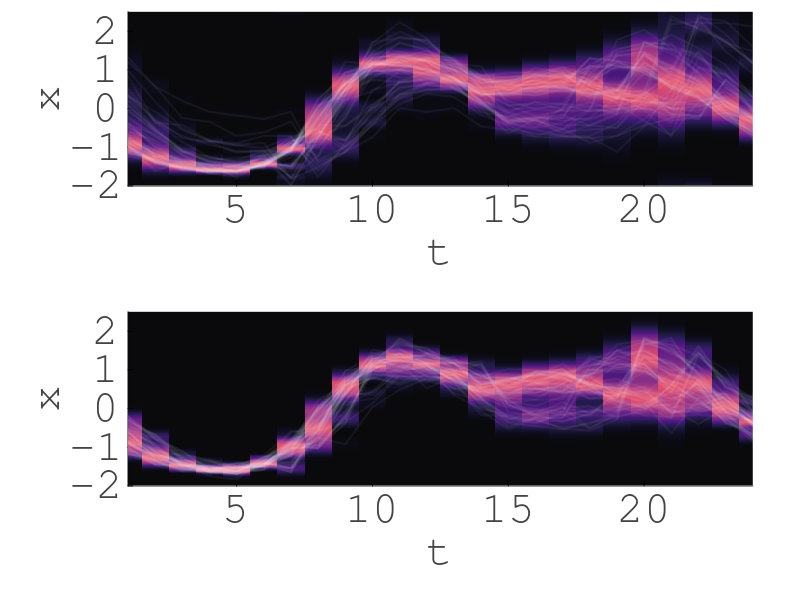

In [42]:
plot(ipd_train_dist, ipd_synth_dist, layout=(2, 1), size=(800, 600))

# NTS5

In [49]:
# period = [20, 30, 40]
# trend = [-3.0, 0.0, 3.0]
# X_train_nts, info = trendy_sine(100, 600; period=period, slope=trend, sigma=0.1, rng=Xoshiro(634655));

In [50]:
@load "NTS5_synthgen_X_train.jld2"

1-element Vector{Symbol}:
 :X_train_nts

In [43]:
# mps_nts, _ = fitMPS(X_train_nts, mps_opts)

In [44]:
# imp_nts = init_imputation_problem(mps_nts, X_train_nts)

In [45]:
# imputed_ts_nts, pred_err_nts, target_ts_nts, stats_nts, plots_nts = MPS_impute(imp_nts, 0, 1, collect(1:100), :ITS; rseed=4567, num_trajectories=600, rejection_threshold=2.0)

In [46]:
@load "nts_synthgen_saved.jld2"

5-element Vector{Symbol}:
 :imputed_ts_nts
 :pred_err_nts
 :target_ts_nts
 :stats_nts
 :plots_nts

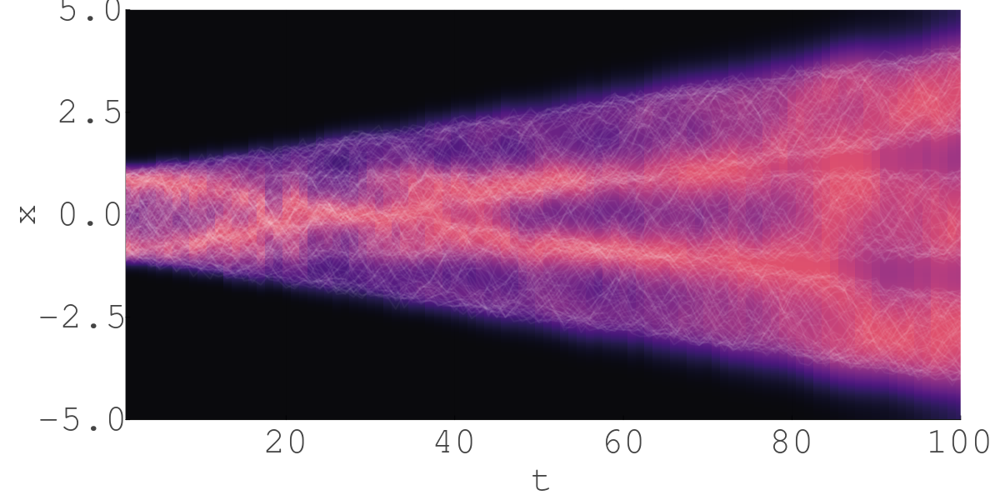

In [52]:
nts_train_dist = make_kde_heatmap(X_train_nts, collect(1:100), 200, max_x=5.0, min_x=-5.0)

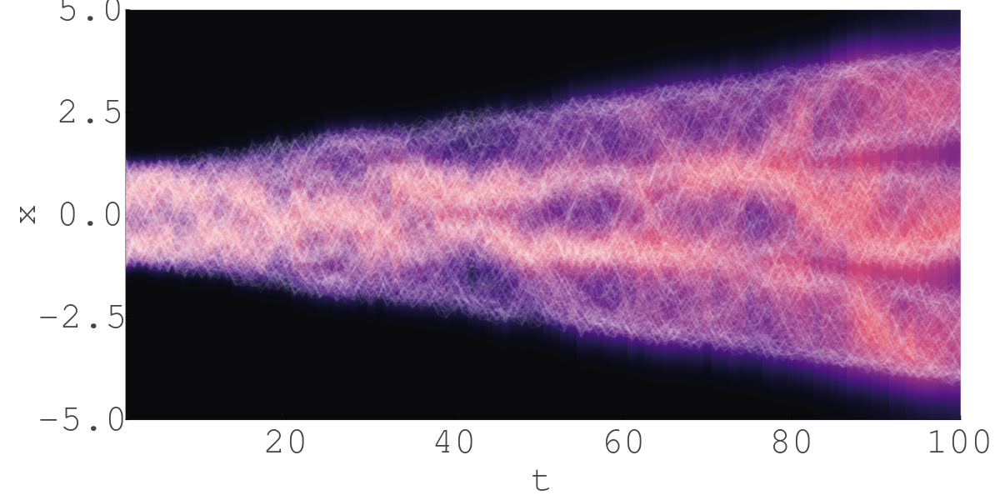

In [56]:
nts_synth_dist = make_kde_heatmap(hcat(imputed_ts_nts...)', collect(1:100), 600, max_x=5.0, min_x=-5.0)

In [54]:
l = @layout [a ; b c]

2×1 Matrix{Any}:
 (label = :a, blank = false)
 Any[(label = :b, blank = false) (label = :c, blank = false)]

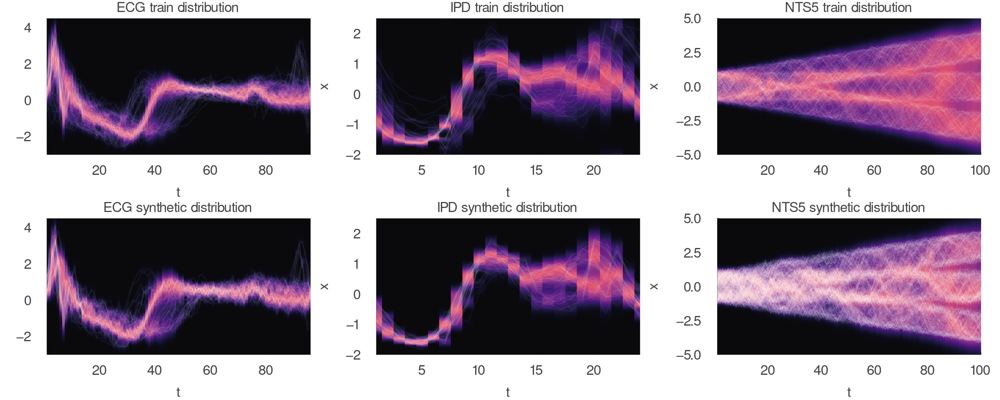

In [61]:
fstyle = font(23, "Helvetica")
plot(ecg_train_dist, ipd_train_dist, 
    nts_train_dist, ecg_synth_dist, 
    ipd_synth_dist, nts_synth_dist, 
    layout=(2, 3), 
    size=(2500, 1000),
    top_margin=5mm, bottom_margin=15mm, right_margin=10mm, left_margin=6mm,
    guidefont=fstyle,
    xtickfont=fstyle,
    ytickfont=fstyle,
    titlefont=fstyle,
    title=["ECG train distribution" "IPD train distribution" "NTS5 train distribution" "ECG synthetic distribution" "IPD synthetic distribution" "NTS5 synthetic distribution"])
#savefig("synthetic_datagen_paper.pdf")
